<a href="https://colab.research.google.com/github/giuliovv/ANNDL_competition_1/blob/master/giulio_models/competition_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os

colab = "True" #@param ['True','False']
if colab == "True":
  from google.colab import drive
  drive.mount('/gdrive')
  %cd /gdrive/MyDrive/Colab Notebooks
  if not os.path.isdir('training'):
    !unzip dataset.zip

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/MyDrive/Colab Notebooks


In [2]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [3]:
dataset_dir = 'training'

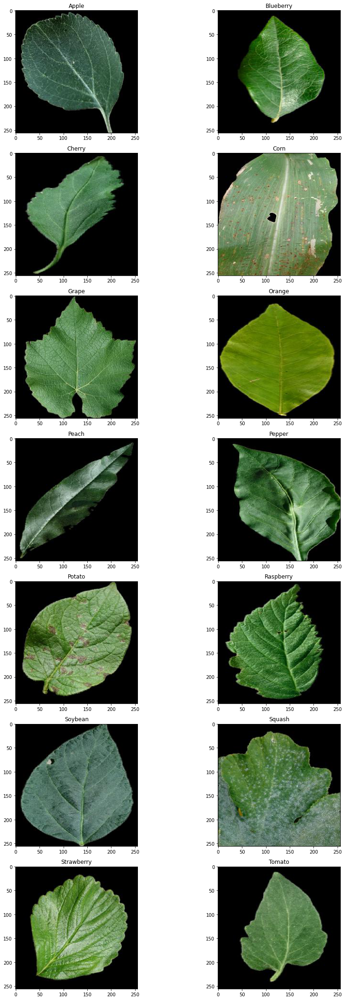

In [4]:
# Plot example images from dataset
labels = ['Apple','Blueberry','Cherry','Corn','Grape','Orange','Peach','Pepper','Potato','Raspberry','Soybean','Squash','Strawberry','Tomato']

num_row = len(labels)//2
num_col = len(labels)//num_row
fig, axes = plt.subplots(num_row, num_col, figsize=(2*num_row,15*num_col))
for i in range(len(labels)):
  if i < len(labels):
    class_imgs = next(os.walk('{}/{}/'.format(dataset_dir, labels[i])))[2]
    class_img = class_imgs[0]
    img = Image.open('{}/{}/{}'.format(dataset_dir, labels[i], class_img))
    ax = axes[i//num_col, i%num_col]
    ax.imshow(np.array(img))
    ax.set_title('{}'.format(labels[i]))
plt.tight_layout()
plt.show()

Let the game begin

In [5]:
import tensorflow as tf

In [6]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from keras.preprocessing.image import ImageDataGenerator

In [7]:
from sklearn.model_selection import train_test_split

In [8]:
y = tf.keras.utils.to_categorical(range(len(labels)))
y

array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]],
      dtype=float32)

In [9]:
import shutil
if not "test" in os.listdir():
  print("No test directory!")
  for label in labels:
    print(label)
    image_names = [pic for pic in os.listdir("training/"+label)]
    train_images, test_images = train_test_split(image_names, test_size=0.05)
    if not 'test/'+label in os.listdir():
      try:
        os.makedirs(os.path.abspath(os.getcwd())+'/test/'+label+'/')
      except OSError:
        print("Failed to create a dir for ", '/test/'+label+'/')
      else:
        print("Success creating folder ", label)
    for name in test_images:
      shutil.move(os.path.abspath(os.getcwd())+'/training/'+label+'/'+name, os.path.abspath(os.getcwd())+'/test/'+label+'/'+name)
  print("Transfered all testing data!")


In [10]:
BATCH_SIZE = 64
VALIDATE_BATCH_SIZE = BATCH_SIZE

train_generator = ImageDataGenerator(
## when rotating some pixels remain unfilled, to fill them the default function is to take the "nearest pixel color", this maybe screws up the learning process so I left it for later training
                                    rotation_range=10,
                                    fill_mode='nearest',
                                    brightness_range=(0.6,1.4),
                                    channel_shift_range=150,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    width_shift_range=0.1, 
                                    height_shift_range=0.1,
                                    horizontal_flip=True, 
                                    vertical_flip=True,
                                    validation_split=0.2,
                                    preprocessing_function=tf.keras.applications.inception_v3.preprocess_input) # VGG16 preprocessing
test_generator = ImageDataGenerator(preprocessing_function=tf.keras.applications.inception_v3.preprocess_input)

traingen = train_generator.flow_from_directory('training',
                                              target_size=(256, 256),
                                              class_mode='categorical',
                                              classes=labels,
                                              subset='training',
                                              batch_size=BATCH_SIZE,
                                              shuffle=True,
                                              seed=42)

validgen = train_generator.flow_from_directory('training',
                                              target_size=(256, 256),
                                              class_mode='categorical',
                                              classes=labels,
                                              subset='validation',
                                              batch_size=VALIDATE_BATCH_SIZE,
                                              shuffle=True,
                                              seed=42)

testgen = test_generator.flow_from_directory('test',
                                            target_size=(256, 256),
                                            class_mode='categorical',
                                            classes=labels,
                                            batch_size=1,
                                            shuffle=False,
                                            seed=42)

Found 13238 images belonging to 14 classes.
Found 3301 images belonging to 14 classes.
Found 877 images belonging to 14 classes.


In [11]:
# create the base pre-trained model
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(256, 256,3))

In [12]:
n_classes = len(labels)

In [13]:
load = False

if load:
  model = tf.keras.models.load_model("inception3_only_top")

In [14]:
if not load:
  # add a global spatial average pooling layer
  x = base_model.output
  x = GlobalAveragePooling2D()(x)
  # let's add a fully-connected layer
  x = Dense(1024, activation='relu')(x)
  # and a logistic layer -- let's say we have n_classes classes
  predictions = Dense(n_classes, activation='softmax')(x)

  # this is the model we will train
  model = Model(inputs=base_model.input, outputs=predictions)


In [15]:
if not load:

  # first: train only the top layers (which were randomly initialized)
  # i.e. freeze all convolutional InceptionV3 layers
  for layer in base_model.layers:
      layer.trainable = False

  optimizer = tf.keras.optimizers.Adam(learning_rate=2e-5)

  # compile the model (should be done *after* setting layers to non-trainable)
  model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [16]:
callbacks = []

early_stop = True
if early_stop:
    es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=6)
    callbacks.append(es_callback)
    
#LRPlateau
lr_plateau_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.2,
    patience=3,
    min_lr=0,
)  

callbacks.append(lr_plateau_callback)

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./logs", histogram_freq=1)

callbacks.append(tensorboard_callback)

backup = tf.keras.callbacks.experimental.BackupAndRestore(
    "top_only"
)

In [17]:
%load_ext tensorboard

In [18]:
%tensorboard --logdir "./logs"

<IPython.core.display.Javascript object>

In [19]:
if not load:
  # train the model on the new data for a few epochs
  model.fit(traingen, epochs=20, steps_per_epoch=10, batch_size=128, validation_data=validgen, callbacks=callbacks+[backup])

Epoch 10/20
10/10 [==============================] - 159s 16s/step - loss: 1.0481 - accuracy: 0.6500 - val_loss: 1.0335 - val_accuracy: 0.6628 - lr: 0.0010
Epoch 11/20
10/10 [==============================] - 155s 16s/step - loss: 0.8295 - accuracy: 0.7453 - val_loss: 1.1996 - val_accuracy: 0.6092 - lr: 0.0010
Epoch 12/20
10/10 [==============================] - 146s 15s/step - loss: 0.6833 - accuracy: 0.7672 - val_loss: 0.9200 - val_accuracy: 0.7061 - lr: 0.0010
Epoch 13/20
10/10 [==============================] - 143s 15s/step - loss: 0.6344 - accuracy: 0.7969 - val_loss: 0.8088 - val_accuracy: 0.7546 - lr: 0.0010
Epoch 14/20
10/10 [==============================] - 145s 15s/step - loss: 0.5901 - accuracy: 0.8188 - val_loss: 0.8359 - val_accuracy: 0.7119 - lr: 0.0010
Epoch 15/20
10/10 [==============================] - 141s 15s/step - loss: 0.5449 - accuracy: 0.8141 - val_loss: 0.7946 - val_accuracy: 0.7477 - lr: 0.0010
Epoch 16/20
10/10 [==============================] - 135s 14s/st

In [20]:
if not load:
  model.save("inception3_only_top")

INFO:tensorflow:Assets written to: inception3_only_top/assets


In [21]:
# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
for i, layer in enumerate(base_model.layers):
   print(i, layer.name)

0 input_1
1 conv2d
2 batch_normalization
3 activation
4 conv2d_1
5 batch_normalization_1
6 activation_1
7 conv2d_2
8 batch_normalization_2
9 activation_2
10 max_pooling2d
11 conv2d_3
12 batch_normalization_3
13 activation_3
14 conv2d_4
15 batch_normalization_4
16 activation_4
17 max_pooling2d_1
18 conv2d_8
19 batch_normalization_8
20 activation_8
21 conv2d_6
22 conv2d_9
23 batch_normalization_6
24 batch_normalization_9
25 activation_6
26 activation_9
27 average_pooling2d
28 conv2d_5
29 conv2d_7
30 conv2d_10
31 conv2d_11
32 batch_normalization_5
33 batch_normalization_7
34 batch_normalization_10
35 batch_normalization_11
36 activation_5
37 activation_7
38 activation_10
39 activation_11
40 mixed0
41 conv2d_15
42 batch_normalization_15
43 activation_15
44 conv2d_13
45 conv2d_16
46 batch_normalization_13
47 batch_normalization_16
48 activation_13
49 activation_16
50 average_pooling2d_1
51 conv2d_12
52 conv2d_14
53 conv2d_17
54 conv2d_18
55 batch_normalization_12
56 batch_normalization_14
5

In [ ]:
# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers[:249]:
   layer.trainable = False
for layer in model.layers[249:]:
   layer.trainable = True

# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import Adam
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

backup2 = tf.keras.callbacks.experimental.BackupAndRestore(
    "second_part"
)

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
model.fit(traingen, epochs=40, steps_per_epoch=10,  batch_size=128, validation_data=validgen, callbacks=callbacks+[backup2])

Epoch 1/40
10/10 [==============================] - 132s 13s/step - loss: 1.1600 - accuracy: 0.6328 - val_loss: 0.7186 - val_accuracy: 0.7610 - lr: 1.0000e-04
Epoch 2/40
10/10 [==============================] - ETA: 0s - loss: 1.0221 - accuracy: 0.6781

In [ ]:
model.save("inception3")

In [ ]:
model.evaluate(X_test, y_test)

In [ ]:
from sklearn.metrics import confusion_matrix
y_pred = model.predict(X_test)

In [ ]:
matrix = confusion_matrix(y_true.argmax(axis=1), y_pred.argmax(axis=1))
matrix.diagonal()/matrix.sum(axis=1)

In [ ]:
tf.keras.backend.mean(tf.keras.backend.equal(tf.keras.backend.argmax(y_test, axis=-1), tf.keras.backend.argmax(y_pred, axis=-1))).numpy()